In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

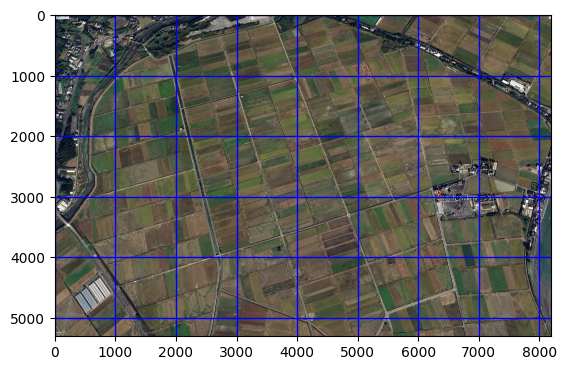

In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def draw_grid_with_labels(image_path):
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Image dimensions
    height, width, _ = img.shape

    # Define grid properties
    step_size = 1000  # Distance between grid lines

    # Create coordinate ranges
    x_ticks = np.arange(0, width, step_size)
    y_ticks = np.arange(0, height, step_size)

    # Plotting the image
    fig, ax = plt.subplots()
    ax.imshow(img)

    # Set ticks
    ax.set_xticks(x_ticks)
    ax.set_yticks(y_ticks)

    # Set tick labels
    ax.set_xticklabels([str(x) for x in x_ticks])
    ax.set_yticklabels([str(y) for y in y_ticks])

    # Draw grid lines
    ax.grid(True, color='blue', linestyle='-', linewidth=1, which='both')
    
    # Show the plot
    plt.show()

# Specify the path to your image
image_path = 'pictures/gep/izumi/202311.jpg'
draw_grid_with_labels(image_path)

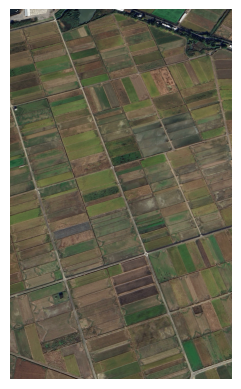

In [3]:
import cv2
import matplotlib.pyplot as plt

def crop_image(image_path, x1, y1, x2, y2):
    # Load the image
    img = cv2.imread(image_path)
    # Crop the image
    cropped_img = img[y1:y2, x1:x2]

    # Display the cropped image
    plt.imshow(cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')  # Hide the axis
    plt.show()

# Replace 'path_to_your_image.jpg' with the actual path to your image
x1, y1 = 3000, 0
x2, y2 = 6000, 5000
crop_image(image_path, x1, y1, x2, y2)

# Loop over the folder draw all figures

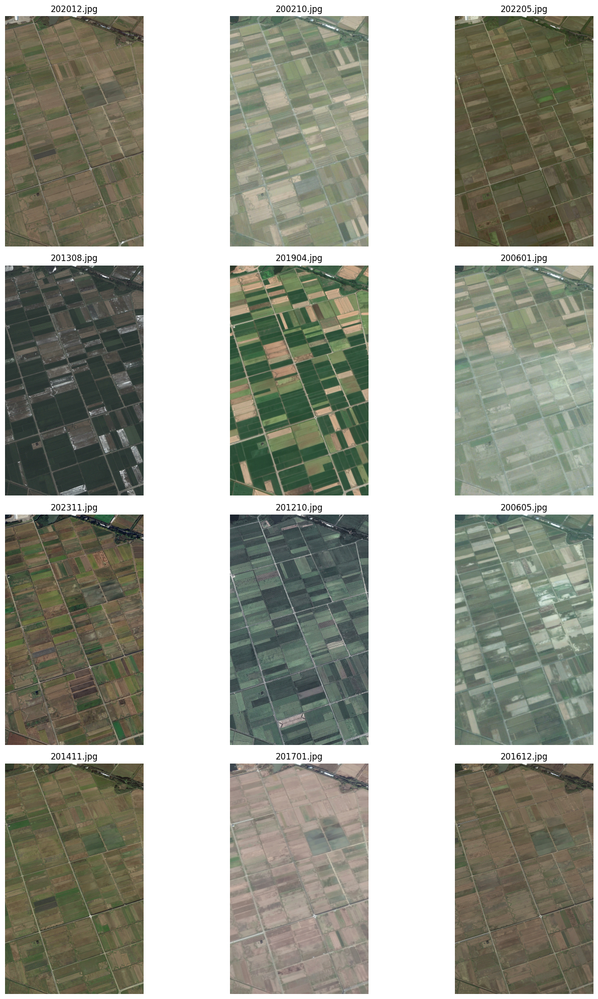

In [4]:
import os
import cv2
import matplotlib.pyplot as plt

def plot_images_in_folder(folder_path):
    # List all files in the folder
    files = [f for f in os.listdir(folder_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
    
    # Calculate the grid size (you might need to adjust this)
    n = len(files)
    cols = 3  # Number of columns in subplot grid
    rows = (n + cols - 1) // cols  # Compute rows needed

    # Create subplots
    fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    axs = axs.ravel()  # Flatten the array of axes

    # Loop through the files and add each to the subplot
    for idx, file in enumerate(files):
        img_path = os.path.join(folder_path, file)
        img = cv2.imread(img_path)

        # Set range
        x1, y1 = 3000, 0
        x2, y2 = 6000, 5000
        
        # Crop the image
        cropped_img = img[y1:y2, x1:x2]

        img = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB)  # Convert color from BGR to RGB
        axs[idx].imshow(img)
        axs[idx].set_title(file)
        axs[idx].axis('off')  # Turn off axis

    # Turn off any unused subplots
    for idx in range(len(files), len(axs)):
        axs[idx].axis('off')

    # Display the plot
    plt.tight_layout()
    plt.show()

# Replace 'path_to_your_folder' with the actual path to your directory containing images
folder_path = 'pictures/gep/izumi'
plot_images_in_folder(folder_path)


# Draw out the key points of the SIFT algorithm

In [ ]:
import numpy as np
import cv2 as cv
img = cv.imread('pictures/gep/izumi/202205.jpg')
# Set range
x1, y1 = 3000, 0
x2, y2 = 6000, 5000
# Crop the image
img = img[y1:y2, x1:x2]

gray= cv.cvtColor(img,cv.COLOR_BGR2GRAY)
sift = cv.SIFT_create()
kp = sift.detect(gray,None)
img=cv.drawKeypoints(gray,kp,img)
plt.figure(figsize=(15,10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
cv.imwrite('sift_keypoints.jpg',img)

# COMPARE Two images

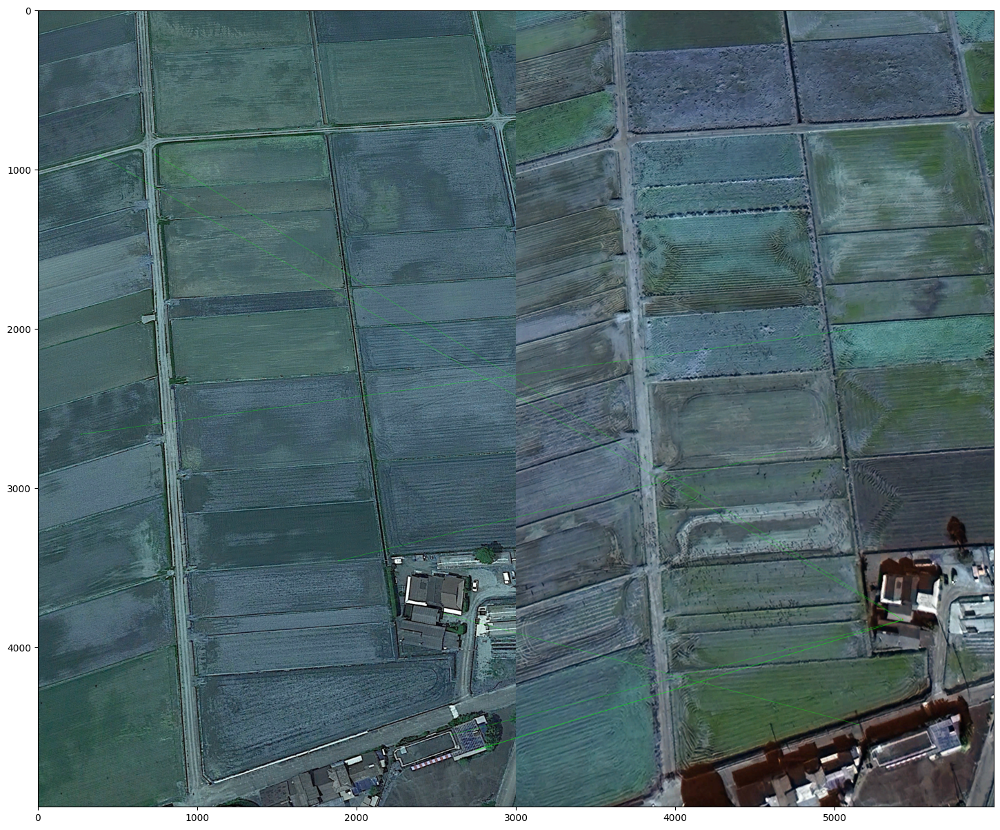

In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def align_images(im1, im2):
    # Convert images to grayscale
    gray1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)

    # Initialize SIFT detector
    sift = cv2.SIFT_create()

    # Find the keypoints and descriptors with SIFT
    keypoints1, descriptors1 = sift.detectAndCompute(gray1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(gray2, None)

    # Create FLANN matcher
    index_params = dict(algorithm=1, trees=5)
    search_params = dict()
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    # Match descriptors
    matches = flann.knnMatch(descriptors1, descriptors2, k=2)

    # Store good matches using Lowe's ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)

    #good_matches = good_matches[:60]
    
    # Minimum number of matches
    MIN_MATCH_COUNT = 10
    if len(good_matches) > MIN_MATCH_COUNT:
        src_pts = np.float32([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1,1,2)
        dst_pts = np.float32([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1,1,2)

        # Compute Homography
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
        h, w = gray1.shape
        im1_aligned = cv2.warpPerspective(im1, M, (w, h))
        
        # Draw poly lines
        matchesMask = mask.ravel().tolist()
        h,w = gray1.shape
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
        dst = cv2.perspectiveTransform(pts,M)
        img2 = cv2.polylines(im2,[np.int32(dst)],True,255,3, cv2.LINE_AA)
        
        
        draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2)

        img3 = cv2.drawMatches(im1,keypoints1,im2,keypoints2,good_matches,None,**draw_params)
        
        plt.figure(figsize=(20, 15))
        plt.imshow(img3, 'gray'),plt.show()
            
        
        return im1_aligned
    else:
        print("Not enough matches are found - {}/{}".format(len(good_matches), MIN_MATCH_COUNT))
        return im1

def compare_images(img1, img2):
    # Align images
    img1_aligned = align_images(img1, img2)
    return 
    # Compute difference
    difference = cv2.absdiff(img1_aligned, img2)
    diff_gray = cv2.cvtColor(difference, cv2.COLOR_BGR2GRAY)
    _, diff_thresh = cv2.threshold(diff_gray, 30, 255, cv2.THRESH_BINARY)

    # Display images
    plt.figure(figsize=(10, 5))
    plt.subplot(131), plt.imshow(cv2.cvtColor(img1_aligned, cv2.COLOR_BGR2RGB)), plt.title('Aligned Image 1')
    plt.subplot(132), plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)), plt.title('Image 2')
    plt.subplot(133), plt.imshow(diff_thresh, cmap='gray'), plt.title('Difference')
    plt.show()

# Load your images
image1 = cv2.imread('pictures/gep/izumi/202205.jpg')
image2 = cv2.imread('pictures/gep/izumi/202311.jpg')

# Set range
x1, y1 = 3000, 0
x2, y2 = 6000, 5000

# Crop the image
image1 = image1[y1:y2, x1:x2]
image2 = image2[y1:y2, x1:x2]

compare_images(image1, image2)

# Grid the cropped picture

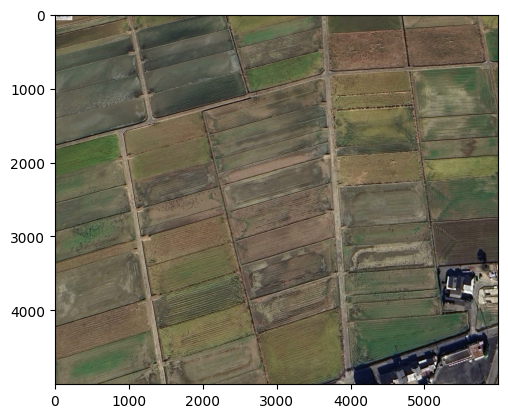

In [58]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def draw_grid_with_labels(img, step_size=500):
    # Image dimensions
    height, width, _ = img.shape

    # Create coordinate ranges
    x_ticks = np.arange(0, width, step_size)
    y_ticks = np.arange(0, height, step_size)

    # Plotting the image
    fig, ax = plt.subplots()
    ax.imshow(img)

    # Set ticks
    ax.set_xticks(x_ticks)
    ax.set_yticks(y_ticks)

    # Set tick labels
    ax.set_xticklabels([str(x) for x in x_ticks])
    ax.set_yticklabels([str(y) for y in y_ticks])

    # Draw grid lines
    ax.grid(True, color='blue', linestyle='-', linewidth=1, which='both')
    
    # Show the plot
    plt.show()

# Specify the path to your image
image_path = 'pictures/gep/izumi/202311.jpg'
# Load the image
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Set range
x1, y1 = 0, 0
x2, y2 = 6000, 5000

# Define grid properties
step_size = 500  # Distance between grid lines
y_max = img.shape[0]
x_max = img.shape[1]


# Crop the image
img = img[y1:y2, x1:x2]
fig, ax = plt.subplots()
ax.imshow(img)
#draw_grid_with_labels(img, step_size)

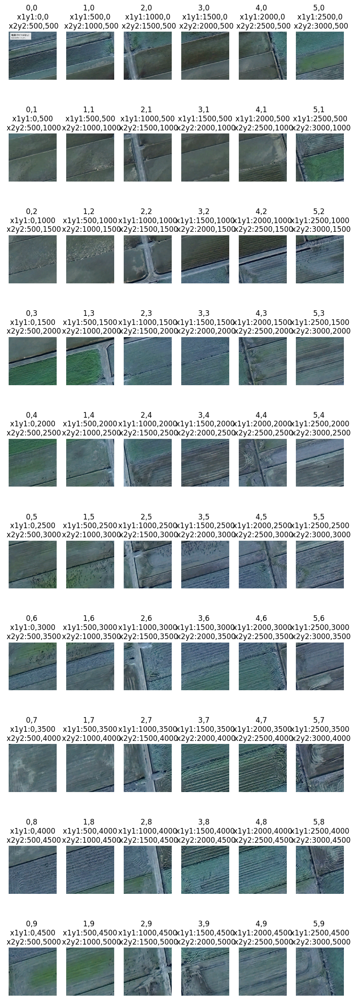

In [59]:
y_max/step_size
x_max/step_size

max_range_i = 6
max_range_j = 10
fig, axs = plt.subplots(max_range_j, max_range_i, figsize=(10,30))
axs = axs.ravel()  # Flatten the array of axes
idx=0
for j in range(max_range_j):
    for i in range(max_range_i):
        x1 = i*step_size
        y1 = j*step_size
        x2 = (i+1)*step_size
        y2 = (j+1)*step_size
        img_crop = img[y1:y2,x1:x2]  
        img_tmp = cv2.cvtColor(img_crop, cv2.COLOR_BGR2RGB)  # Convert color from BGR to RGB
        axs[idx].imshow(img_tmp)
        axs[idx].set_title(str(i)+","+str(j) + " \n x1y1:" + str(x1) + "," + str(y1) + " \n x2y2:" + str(x2) + "," + str(y2))
        axs[idx].axis('off')  # Turn off axis
        idx=idx+1
        cv.imwrite('image0.jpg',img_crop0)

5000

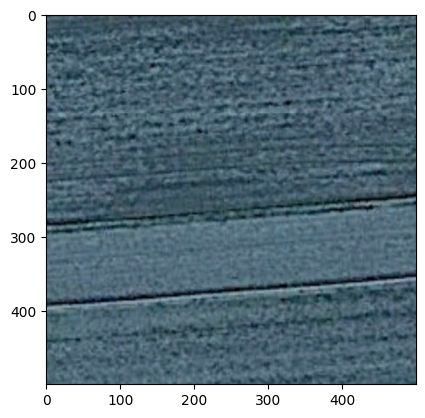

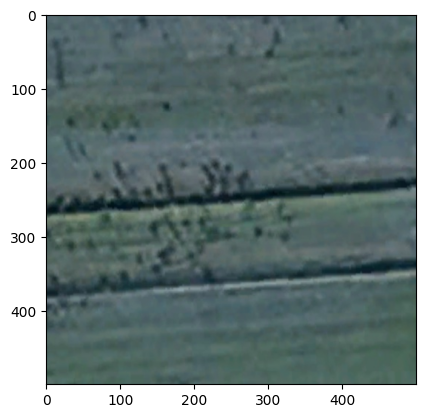

ヒストグラムの類似度: 0.6627103291156542


True

In [35]:
# Specify the path to your image
image_path = 'pictures/gep/izumi/202205.jpg'
# Load the image
img0 = cv2.imread(image_path)
img0 = cv2.cvtColor(img0, cv2.COLOR_BGR2RGB)
# Set range
x1, y1 = 3000, 0
x2, y2 = 6000, 5000
# Crop the image
img0 = img0[y1:y2, x1:x2]

x1 = 1500
y1 = 3500
x2 = 2000
y2 = 4000 
img_crop0 = img0[y1:y2,x1:x2]  
img_tmp0 = cv2.cvtColor(img_crop0, cv2.COLOR_BGR2RGB)  # Convert color from BGR to RGB
plt.imshow(img_tmp0)
plt.show()

# Specify the path to your image
image_path = 'pictures/gep/izumi/202311.jpg'
# Load the image
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Set range
x1, y1 = 3000, 0
x2, y2 = 6000, 5000
# Crop the image
img = img[y1:y2, x1:x2]

x1 = 1500
y1 = 3500
x2 = 2000
y2 = 4000 
img_crop = img[y1:y2,x1:x2]  
img_tmp = cv2.cvtColor(img_crop, cv2.COLOR_BGR2RGB)  # Convert color from BGR to RGB
plt.imshow(img_tmp)
plt.show()

# ヒストグラムを計算する
hist1 = cv2.calcHist([img_crop0], [0], None, [256], [0, 256])
hist2 = cv2.calcHist([img_crop], [0], None, [256], [0, 256])
# ヒストグラムを比較する
similarity = cv2.compareHist(hist1, hist2, cv2.HISTCMP_CORREL)
print(f'ヒストグラムの類似度: {similarity}')

cv.imwrite('image0.jpg',img_crop0)
cv.imwrite('image1.jpg',img_crop)

TypeError: FigureBase.suptitle() takes 2 positional arguments but 3 were given

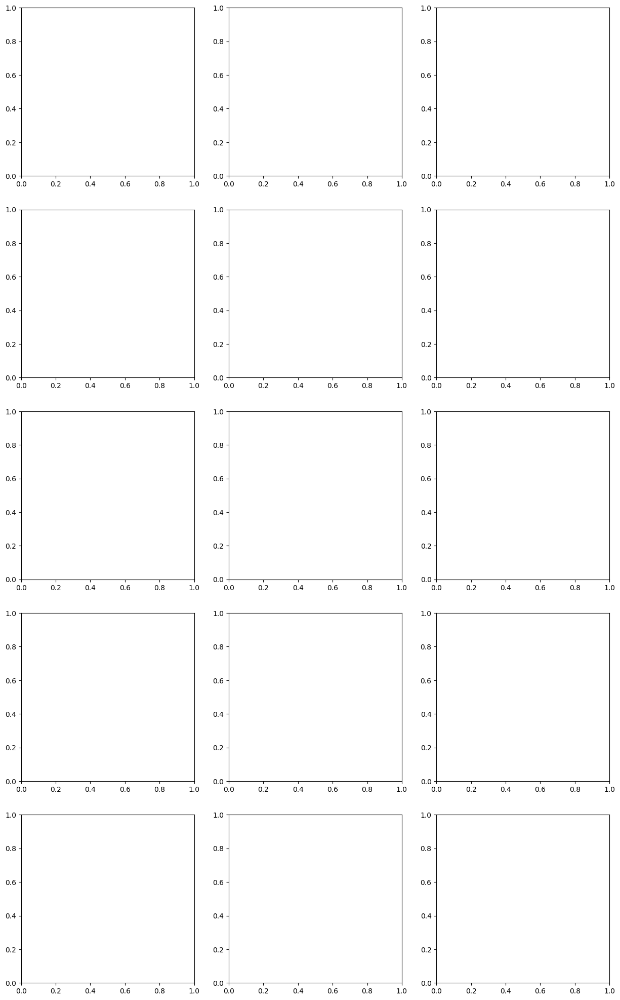

In [36]:
import os
import cv2
import matplotlib.pyplot as plt
# Replace 'path_to_your_folder' with the actual path to your directory containing images
folder_path = 'pictures/gep/'

max_range_i = 6
max_range_j = 10

# List all files in the folder
files = [f for f in os.listdir(folder_path) if f.endswith(('.png', '.jpg', '.jpeg'))]

idx=0
for j in range(max_range_j):
    for i in range(max_range_i):
        step_size = 500
        x1 = i*step_size
        y1 = j*step_size
        x2 = (i+1)*step_size
        y2 = (j+1)*step_size
         
        # Loop through the files and add each to the subplot
        ii=0
        # Calculate the grid size (you might need to adjust this)
        n = len(files)
        cols = 3  # Number of columns in subplot grid
        rows = (n + cols - 1) // cols  # Compute rows needed# Create subplots

        fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))
        axs = axs.ravel()  # Flatten the array of axes
        fig.suptitle("x,y="+str(i)+","+str(j))
        for ii, file in enumerate(files):
            img_path = os.path.join(folder_path, file)
            img = cv2.imread(img_path)

            img_crop = img[y1:y2,x1:x2]  
            img_tmp = cv2.cvtColor(img_crop, cv2.COLOR_BGR2RGB)  # Convert color from BGR to RGB
            axs[ii].imshow(img_tmp)
            axs[ii].set_title(file)
            axs[ii].axis('off')  # Turn off axis
            ii=ii+1
        r
        idx=idx+1
    break